In [57]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt

In [58]:
df = pd.read_csv('./Datasets/Data_Combinada.csv')

/tmp/ipykernel_61548/2478976544.py:1: DtypeWarning: Columns (15,16) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('./Datasets/Data_Combinada.csv')


In [59]:
df.head()

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,...,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,numero_pasajeros,fugado
0,2022S000001,01/01/2022,1:30:00,"AVDA. ALBUFERA, 19",19,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 30 a 34 años,M,NaN,NaN,"443359,226","4472082,272",0.0,0.0,2,No
1,2022S000001,01/01/2022,1:30:00,"AVDA. ALBUFERA, 19",19,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 45 a 49 años,H,NaN,NaN,"443359,226","4472082,272",0.0,0.0,2,No
2,2022S000002,01/01/2022,0:30:00,PLAZA. CANOVAS DEL CASTILLO / PASEO. PRADO,2,3.0,RETIRO,Colisión fronto-lateral,NaN,Motocicleta hasta 125cc,...,De 30 a 34 años,H,NaN,NaN,"441155,351","4474129,588",1.0,0.0,3,No
3,2022S000002,01/01/2022,0:30:00,PLAZA. CANOVAS DEL CASTILLO / PASEO. PRADO,2,3.0,RETIRO,Colisión fronto-lateral,NaN,Motocicleta hasta 125cc,...,De 35 a 39 años,M,NaN,NaN,"441155,351","4474129,588",0.0,0.0,3,No
4,2022S000002,01/01/2022,0:30:00,PLAZA. CANOVAS DEL CASTILLO / PASEO. PRADO,2,3.0,RETIRO,Colisión fronto-lateral,NaN,Turismo,...,De 40 a 44 años,H,NaN,NaN,"441155,351","4474129,588",0.0,0.0,3,No


In [60]:
df_vallecas = df[df['distrito'] == "PUENTE DE VALLECAS"].copy()
df_vallecas.head()

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,...,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,numero_pasajeros,fugado
0,2022S000001,01/01/2022,1:30:00,"AVDA. ALBUFERA, 19",19,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 30 a 34 años,M,NaN,NaN,"443359,226","4472082,272",0.0,0.0,2,No
1,2022S000001,01/01/2022,1:30:00,"AVDA. ALBUFERA, 19",19,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 45 a 49 años,H,NaN,NaN,"443359,226","4472082,272",0.0,0.0,2,No
30,2022S000015,01/01/2022,7:25:00,"AVDA. ENTREVIAS, 94",94,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 35 a 39 años,H,7.0,Asistencia sanitaria sólo en el lugar del acci...,"443634,572","4469942,483",0.0,0.0,3,No
31,2022S000015,01/01/2022,7:25:00,"AVDA. ENTREVIAS, 94",94,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 40 a 44 años,H,14.0,Sin asistencia sanitaria,"443634,572","4469942,483",1.0,0.0,3,No
32,2022S000015,01/01/2022,7:25:00,"AVDA. ENTREVIAS, 94",94,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 35 a 39 años,H,7.0,Asistencia sanitaria sólo en el lugar del acci...,"443634,572","4469942,483",0.0,0.0,3,No


In [61]:
def strip_num(string):
    return re.sub(r'[\d,]+', '', string)

In [62]:
df_vallecas['localizacion'] = df_vallecas['localizacion'].apply(strip_num)

In [63]:
df_vallecas.head()

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,...,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,numero_pasajeros,fugado
0,2022S000001,01/01/2022,1:30:00,AVDA. ALBUFERA,19,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 30 a 34 años,M,NaN,NaN,"443359,226","4472082,272",0.0,0.0,2,No
1,2022S000001,01/01/2022,1:30:00,AVDA. ALBUFERA,19,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 45 a 49 años,H,NaN,NaN,"443359,226","4472082,272",0.0,0.0,2,No
30,2022S000015,01/01/2022,7:25:00,AVDA. ENTREVIAS,94,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 35 a 39 años,H,7.0,Asistencia sanitaria sólo en el lugar del acci...,"443634,572","4469942,483",0.0,0.0,3,No
31,2022S000015,01/01/2022,7:25:00,AVDA. ENTREVIAS,94,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 40 a 44 años,H,14.0,Sin asistencia sanitaria,"443634,572","4469942,483",1.0,0.0,3,No
32,2022S000015,01/01/2022,7:25:00,AVDA. ENTREVIAS,94,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 35 a 39 años,H,7.0,Asistencia sanitaria sólo en el lugar del acci...,"443634,572","4469942,483",0.0,0.0,3,No


In [64]:
(df_vallecas.groupby('localizacion').count().sort_values(by='num_expediente', ascending=False))

,num_expediente,fecha,hora,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,numero_pasajeros,fugado
localizacion,,,,,,,,,,,,,,,,,,,,
AVDA. ALBUFERA,317,317,317,317,317,317,317,272,315,317,317,317,185,185,317,317,317,317,317,317
AUTOV. M- +E,123,123,123,123,123,123,123,109,122,123,123,123,60,60,123,123,123,123,123,123
AVDA. ENTREVIAS,115,115,115,115,115,115,115,101,115,115,115,115,75,75,115,115,115,115,115,115
AVDA. PABLO NERUDA,88,88,88,88,88,88,88,75,88,88,88,88,48,48,88,88,88,88,88,88
AVDA. ALBUFERA / AUTOV. M-,82,82,82,82,82,82,82,75,81,82,82,82,28,28,82,82,82,82,82,82
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AVDA. PABLO NERUDA G,1,1,1,1,1,1,1,0,1,1,1,1,0,0,1,1,1,1,1,1
CALL. SIERRA DE ALQUIFE / PUERTO DE ARLA,1,1,1,1,1,1,1,1,1,1,1,1,0,0,1,1,1,1,1,1
AVDA. PABLO NERUDA / CALL. LEONESES,1,1,1,1,1,1,1,0,1,1,1,1,0,0,1,1,1,1,1,1


Miramos los accidentes en el cuartil más alto del distrito con más accidentes

In [65]:
df_grouped = df_vallecas.groupby('localizacion').count()
counts = df_grouped['num_expediente']

Q1 = counts.quantile(0.25)
Q3 = counts.quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = counts[(counts < lower_bound) | (counts > upper_bound)]

percentile_95 = counts.quantile(0.95)

top_5_percent_df = df_grouped[df_grouped['num_expediente'] >= percentile_95].reset_index()

top_5_percent_df = top_5_percent_df.sort_values(by=['num_expediente'], ascending=False)

Vamos a ver donde se concentran los accidentes, mirando ahora la imagen completa, con el número de calle, y los tipos de accidentes

In [66]:
filtered_df_vallecas = df_vallecas[df_vallecas['localizacion'].isin(top_5_percent_df['localizacion'])].copy()
filtered_df_vallecas.sort_values(by=['localizacion'])

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,...,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,numero_pasajeros,fugado
26493,2022S022610,02/08/2022,18:10:00,AUTOV. A- +E,+00400E,13.0,PUENTE DE VALLECAS,Colisión múltiple,NaN,Turismo,...,De 45 a 49 años,H,NaN,NaN,"441976,313","4469760,365",0.0,0.0,3,No
13166,2022S011020,20/04/2022,18:15:00,AUTOV. A- +E,+00500E,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 30 a 34 años,H,14.0,Sin asistencia sanitaria,"442028,358","4469677,005",0.0,0.0,5,No
31734,2022S027913,26/09/2022,7:00:00,AUTOV. A- +E,+00500E,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 45 a 49 años,M,NaN,NaN,"442086,031","4469589,003",0.0,0.0,3,No
31733,2022S027913,26/09/2022,7:00:00,AUTOV. A- +E,+00500E,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 50 a 54 años,H,NaN,NaN,"442086,031","4469589,003",0.0,0.0,3,No
31732,2022S027913,26/09/2022,7:00:00,AUTOV. A- +E,+00500E,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Camión rígido,...,De 40 a 44 años,H,NaN,NaN,"442086,031","4469589,003",0.0,0.0,3,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39301,2022S035733,21/11/2022,9:15:00,CMNO. VALDERRIBAS,120,13.0,PUENTE DE VALLECAS,Colisión lateral,Nublado,Turismo,...,De 30 a 34 años,H,NaN,NaN,"444150,018","4471900,63",0.0,0.0,2,No
49243,2023S003225,03/02/2023,8:15:00,CMNO. VALDERRIBAS,113,13.0,PUENTE DE VALLECAS,Alcance,NaN,Turismo,...,De 40 a 44 años,M,NaN,NaN,444239.418,4471771.265,0.0,0.0,2,No
58049,2023S015043,12/04/2023,20:30:00,CMNO. VALDERRIBAS,99,13.0,PUENTE DE VALLECAS,Choque contra obstáculo fijo,Nublado,Furgoneta,...,De 55 a 59 años,H,14.0,Sin asistencia sanitaria,444071.691,4472239.309,0.0,0.0,5,No
58047,2023S015043,12/04/2023,20:30:00,CMNO. VALDERRIBAS,99,13.0,PUENTE DE VALLECAS,Choque contra obstáculo fijo,Nublado,Furgoneta,...,De 55 a 59 años,H,7.0,Asistencia sanitaria sólo en el lugar del acci...,444071.691,4472239.309,0.0,0.0,5,No


In [67]:
filtered_df_vallecas['coordenada_x_utm'] = pd.to_numeric(filtered_df_vallecas['coordenada_x_utm'].str.replace(',', '.'),
                                                         errors='coerce')
filtered_df_vallecas['coordenada_y_utm'] = pd.to_numeric(filtered_df_vallecas['coordenada_y_utm'].str.replace(',', '.'),
                                                         errors='coerce')

filtered_df_vallecas.dropna(subset=['coordenada_x_utm', 'coordenada_y_utm'], inplace=True)

In [68]:
filtered_df_vallecas

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,...,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,numero_pasajeros,fugado
0,2022S000001,01/01/2022,1:30:00,AVDA. ALBUFERA,19,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 30 a 34 años,M,NaN,NaN,443359.226,4472082.272,0.0,0.0,2,No
1,2022S000001,01/01/2022,1:30:00,AVDA. ALBUFERA,19,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 45 a 49 años,H,NaN,NaN,443359.226,4472082.272,0.0,0.0,2,No
30,2022S000015,01/01/2022,7:25:00,AVDA. ENTREVIAS,94,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 35 a 39 años,H,7.0,Asistencia sanitaria sólo en el lugar del acci...,443634.572,4469942.483,0.0,0.0,3,No
31,2022S000015,01/01/2022,7:25:00,AVDA. ENTREVIAS,94,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 40 a 44 años,H,14.0,Sin asistencia sanitaria,443634.572,4469942.483,1.0,0.0,3,No
32,2022S000015,01/01/2022,7:25:00,AVDA. ENTREVIAS,94,13.0,PUENTE DE VALLECAS,Alcance,Despejado,Turismo,...,De 35 a 39 años,H,7.0,Asistencia sanitaria sólo en el lugar del acci...,443634.572,4469942.483,0.0,0.0,3,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65455,2023S022129,05/06/2023,20:15:00,AVDA. ALBUFERA / AUTOV. M-,302,13.0,PUENTE DE VALLECAS,Colisión lateral,Nublado,Turismo,...,De 25 a 29 años,H,NaN,NaN,446019.735,4470758.527,0.0,0.0,4,No
65456,2023S022129,05/06/2023,20:15:00,AVDA. ALBUFERA / AUTOV. M-,302,13.0,PUENTE DE VALLECAS,Colisión lateral,Nublado,Turismo,...,De 35 a 39 años,H,NaN,NaN,446019.735,4470758.527,0.0,0.0,4,No
65512,2023S022164,06/06/2023,11:25:00,AVDA. PABLO NERUDA,50,13.0,PUENTE DE VALLECAS,Colisión múltiple,NaN,Furgoneta,...,De 40 a 44 años,H,NaN,NaN,445291.488,4471072.805,0.0,0.0,3,No
65513,2023S022164,06/06/2023,11:25:00,AVDA. PABLO NERUDA,50,13.0,PUENTE DE VALLECAS,Colisión múltiple,NaN,Turismo,...,Desconocido,H,NaN,NaN,445291.488,4471072.805,0.0,0.0,3,No


In [69]:
import utm
import folium


def utm_to_latlon(utm_x, utm_y, zone_number=30, zone_letter='T'):
    """
    Convert UTM coordinates to Latitude and Longitude.
    Assumes zone number 30 and zone letter 'T' for Madrid.
    """
    try:
        lat, lon = utm.to_latlon(utm_x, utm_y, zone_number, zone_letter)
        return lat, lon
    except Exception as e:
        print("Error en la conversión:", e, " utmx: ", utm_x, "utmy: ", utm_y, " ")
        return None, None


# Processing the data: converting UTM coordinates to latitude and longitude
coordinates = filtered_df_vallecas.filter(
    items=['coordenada_x_utm', 'coordenada_y_utm', 'tipo_accidente', 'tipo_vehiculo'])
coordinates.columns = ['utm_x', 'utm_y', 'tipo_accidente', 'tipo_vehiculo']
# Apply the conversion
coordinates['lat'], coordinates['lon'] = zip(
    *coordinates.apply(lambda row: utm_to_latlon(row['utm_x'], row['utm_y']), axis=1))
# Drop rows with NaN values in lat/lon
coordinates.dropna(subset=['lat', 'lon'], inplace=True)

# Creating a map centered around Madrid
madrid_map = folium.Map(location=[40.4168, -3.7038], zoom_start=12)

# Adding the coordinates to the map
for idx, row in coordinates.iterrows():
    label = f'Lat: {row["lat"]}, Lon: {row["lon"]}, \nAccidente: {row["tipo_accidente"]}, \nVehículo: {row["tipo_vehiculo"]}'
    folium.Marker([row['lat'], row['lon']], popup=label).add_to(madrid_map)
# Save the map to an HTML file
map_file = 'Maps/madrid_map.html'
madrid_map.save(map_file)

map_file

'Maps/madrid_map.html'

Vamos a filtrar todas las carreteras

In [70]:
def path_denomination(path: str):
    return path.split()[0].upper().replace(',', '').replace('.', '')

In [71]:
df['first_word'] = df['localizacion'].apply(path_denomination)
result = df.groupby('first_word')['localizacion'].count()
result.sort_values(ascending=False)

first_word
CALL        41024
AVDA        12934
AUTOV        7212
PASEO        4690
PLAZA        2501
            ...  
LEONARDO        1
LATINA          1
ENLACE          1
RETIRO          1
ZONA            1
Name: localizacion, Length: 343, dtype: int64

# Estudio Medidas implementadas en la M-30 desde el 2022
A continuación iniciaremos un análisis exploratorio sobre las medidas ZBE implementadas a partir del año 2022 en la ciudad de Madrid:
En resumen las Medidas Implementadas:
1. Zona de Bajas Emisiones (ZBE):

**En enero de 2022**, se prohibió el acceso y la circulación de vehículos sin distintivo ambiental en las vías públicas urbanas del interior de la M-30 (excluyendo la propia M-30).
**En enero de 2023**, se extendió la prohibición al propio tramo de la M-30.
**En enero de 2024**, la prohibición cubrió todas las vías públicas urbanas del municipio de Madrid.
**Para enero de 2025**, se espera que la prohibición se extienda a los turismos A domiciliados en Madrid y a otros vehículos A no turismos (camiones, furgonetas, motocicletas y ciclomotores) que hasta el 31 de diciembre de 2024 no tenían restricciones.

2. Instalación de cámaras y sistemas de control:

Para vigilar y controlar la ZBE, se han instalado 207 cámaras de tráfico adicionales en el exterior de la M-30, sumándose a las 257 cámaras y 37 semáforos con control foto-rojo ya existentes.

In [72]:
# Lee el archivo CSV de 2021
data_2021 = pd.read_csv("./Datasets/2021_Accidentalidad.csv", sep=";")

# Convierte la columna 'fecha' a datetime para poder filtrar por año en ambos datasets
df['fecha'] = pd.to_datetime(df['fecha'], format='%d/%m/%Y')
data_2021['fecha'] = pd.to_datetime(data_2021['fecha'], format='%d/%m/%Y')

# Filtra los datos de 2022 y 2023 a partir del conjunto de datos 'df'
data_2022 = df[df['fecha'].dt.year == 2022]
data_2023 = df[df['fecha'].dt.year == 2023]

# Filtrar los registros específicos de la M-30 para 2021, 2022 y 2023
m30_2021 = data_2021[data_2021['localizacion'].str.contains('M-30')]
m30_2022 = data_2022[data_2022['localizacion'].str.contains('M-30')]
m30_2023 = data_2023[data_2023['localizacion'].str.contains('M-30')]

# Calculando el número de registros mensuales para cada año para la M-30
m30_2021['mes'] = m30_2021['fecha'].dt.month
m30_2022['mes'] = m30_2022['fecha'].dt.month
m30_2023['mes'] = m30_2023['fecha'].dt.month

registros_mensuales_2021 = m30_2021.groupby('mes').size()
registros_mensuales_2022 = m30_2022.groupby('mes').size()
registros_mensuales_2023 = m30_2023.groupby('mes').size()

registros_mensuales_2021, registros_mensuales_2022, registros_mensuales_2023

/tmp/ipykernel_61548/2716251663.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m30_2021['mes'] = m30_2021['fecha'].dt.month
/tmp/ipykernel_61548/2716251663.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m30_2022['mes'] = m30_2022['fecha'].dt.month
/tmp/ipykernel_61548/2716251663.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/

(mes
 1     185
 2     277
 3     359
 4     276
 5     246
 6     281
 7     235
 8     144
 9     512
 10    478
 11    472
 12    454
 dtype: int64,
 mes
 1     276
 2     367
 3     308
 4     347
 5     370
 6     314
 7     259
 8     171
 9     274
 10    289
 11    402
 12    434
 dtype: int64,
 mes
 1    310
 2    330
 3    309
 4    250
 5    299
 6    231
 7    204
 8    175
 dtype: int64)

Hemos realizado los registros mensuales de accidentes en la M-30 para los años 2021, 2022 y 2023 (hasta septiembre). A continuación, se presenta el número de registros por mes para cada año, lo que nos permitirá evaluar cómo ha evolucionado el tráfico en la M-30 en relación con las medidas implementadas.

### Número de Registros por Mes en la M-30:
**2021**:
Enero: 185
Febrero: 277
Marzo: 359
Abril: 276
Mayo: 246
Junio: 281
Julio: 235
Agosto: 144
Septiembre: 512
Octubre: 478
Noviembre: 472
Diciembre: 454

**2022**:
Enero: 276
Febrero: 367
Marzo: 308
Abril: 347
Mayo: 370
Junio: 314
Julio: 259
Agosto: 171
Septiembre: 274
Octubre: 289
Noviembre: 402
Diciembre: 434

**2023 (hasta septiembre)**:
Enero: 310
Febrero: 330
Marzo: 309
Abril: 250
Mayo: 299
Junio: 231
Julio: 204
Agosto: 175

#### Análisis Comparativo:
Al comparar los datos de 2021 y 2022, se observa un incremento en la mayoría de los meses en 2022. Esto podría deberse a una recuperación del tráfico tras las restricciones de la pandemia o a cambios en la detección y reporte de incidentes.
Para 2023, aunque los datos están disponibles solo hasta septiembre, se observa una tendencia a la disminución en la cantidad de registros en comparación con 2022, particularmente en los meses más recientes (junio a agosto). Esto podría ser indicativo de un impacto positivo de las medidas implementadas en la M-30, especialmente considerando que en enero de 2023, la prohibición se extendió al propio tramo de la M-30. Esto es debido a que al prohibir la circulación de vehículos más viejos, se ha mejorado la seguridad en la carretera

#### **Conclusiones**:
La tendencia decreciente en los últimos meses de 2023 podría ser un indicador temprano de la efectividad de las medidas de ZBE implementadas en la M-30, aunque se necesita más tiempo y datos para confirmar esta tendencia y entender su impacto total. Además, se deberían considerar factores externos que puedan afectar el tráfico y la incidencia de accidentes, como cambios en los patrones de movilidad urbana, el clima, y eventos específicos en la ciudad.

Además, dicha medida no fue del todo implementada para mejorar el tráfico únicamente, sino para mejorar la calidad del aire en la ciudad.
#### Impactos y Observaciones de la Medida ZBE:
**-Reducción de la Contaminación**: En 2023, los niveles de dióxido de nitrógeno en Madrid fueron más bajos que el año anterior, lo que indica una mejora en la calidad del aire de la ciudad, atribuida a la implementación de la ZBE.
**-Cumplimiento de Normativas Europeas**: El 2022 fue el primer año en que Madrid cumplió con la directiva europea de calidad del aire, lo que sugiere un impacto positivo de las medidas de tráfico implementadas.
**-Reducción de Vehículos Contaminantes**: Se observó una disminución en el número de vehículos más contaminantes (matrícula A) hasta un 2.3% del total en el interior de la ciudad. Las cámaras detectan diariamente unos 2.000 vehículos tipo A sancionable

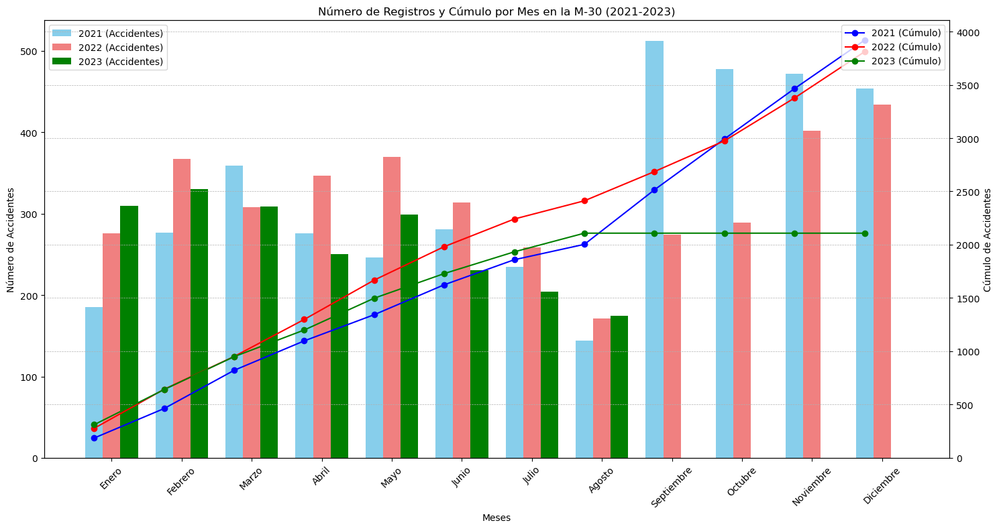

In [73]:
import numpy as np
import matplotlib.pyplot as plt

months = [
    "Enero", "Febrero", "Marzo", "Abril", "Mayo", "Junio",
    "Julio", "Agosto", "Septiembre", "Octubre", "Noviembre", "Diciembre"
]

accidents_2021 = [185, 277, 359, 276, 246, 281, 235, 144, 512, 478, 472, 454]
accidents_2022 = [276, 367, 308, 347, 370, 314, 259, 171, 274, 289, 402, 434]
accidents_2023 = [310, 330, 309, 250, 299, 231, 204, 175]
accidents_2023.extend([0] * (12 - len(accidents_2023)))
months_index = np.arange(len(months))

cumulative_accidents_2021 = np.cumsum(accidents_2021)
cumulative_accidents_2022 = np.cumsum(accidents_2022)
cumulative_accidents_2023 = np.cumsum(accidents_2023)

bar_width = 0.25  # Ancho de las barras
bar_positions_2021 = np.arange(len(months))
bar_positions_2022 = bar_positions_2021 + bar_width
bar_positions_2023 = bar_positions_2022 + bar_width

fig, ax1 = plt.subplots(figsize=(15, 8))

ax1.bar(bar_positions_2021, accidents_2021, width=bar_width, label='2021 (Accidentes)', color='skyblue')
ax1.bar(bar_positions_2022, accidents_2022, width=bar_width, label='2022 (Accidentes)', color='lightcoral')
ax1.bar(bar_positions_2023, accidents_2023, width=bar_width, label='2023 (Accidentes)', color='green')
ax1.set_xlabel('Meses')
ax1.set_ylabel('Número de Accidentes', color='black')
ax1.tick_params(axis='y', labelcolor='black')
ax1.set_xticks(bar_positions_2022)
ax1.set_xticklabels(months, rotation=45)
ax1.legend(loc='upper left')

ax2 = ax1.twinx()
ax2.plot(months_index, cumulative_accidents_2021, label='2021 (Cúmulo)', color='blue', marker='o')
ax2.plot(months_index, cumulative_accidents_2022, label='2022 (Cúmulo)', color='red', marker='o')
ax2.plot(months_index, cumulative_accidents_2023, label='2023 (Cúmulo)', color='green', marker='o')
ax2.set_ylabel('Cúmulo de Accidentes', color='black')
ax2.tick_params(axis='y', labelcolor='black')
ax2.legend(loc='upper right')

# Detalles adicionales
plt.title('Número de Registros y Cúmulo por Mes en la M-30 (2021-2023)')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Mostrar el gráfico
plt.tight_layout()
plt.show()


In [74]:
resumen_2021 = m30_2021.groupby('tipo_accidente').count().reset_index().rename(columns={'num_expediente': '2021'})
resumen_2022 = m30_2022.groupby('tipo_accidente').count().reset_index().rename(columns={'num_expediente': '2022'})
resumen_2023 = m30_2023.groupby('tipo_accidente').count().reset_index().rename(columns={'num_expediente': '2023'})

# Fusionar los DataFrames de resumen en uno solo
comparativa = resumen_2021.merge(resumen_2022, on='tipo_accidente', how='outer').merge(resumen_2023,
                                                                                       on='tipo_accidente', how='outer')

# Ordenar por el año con más accidentes
comparativa = comparativa.sort_values(by=['2021', '2022', '2023'], ascending=False)

# Si deseas llenar los valores NaN con 0, puedes hacerlo así:
comparativa = comparativa.fillna(0)

In [75]:
comparativa = comparativa.filter(items=['tipo_accidente', '2021', '2022', '2023'])
comparativa

,tipo_accidente,2021,2022,2023
0,Alcance,1932.0,1838,1083
7,Colisión múltiple,818.0,688,351
6,Colisión lateral,451.0,537,273
3,Choque contra obstáculo fijo,251.0,279,140
5,Colisión fronto-lateral,155.0,145,90
2,Caída,138.0,127,81
4,Colisión frontal,89.0,77,28
10,Vuelco,28.0,37,21
8,Otro,26.0,36,22
9,Solo salida de la vía,18.0,25,16


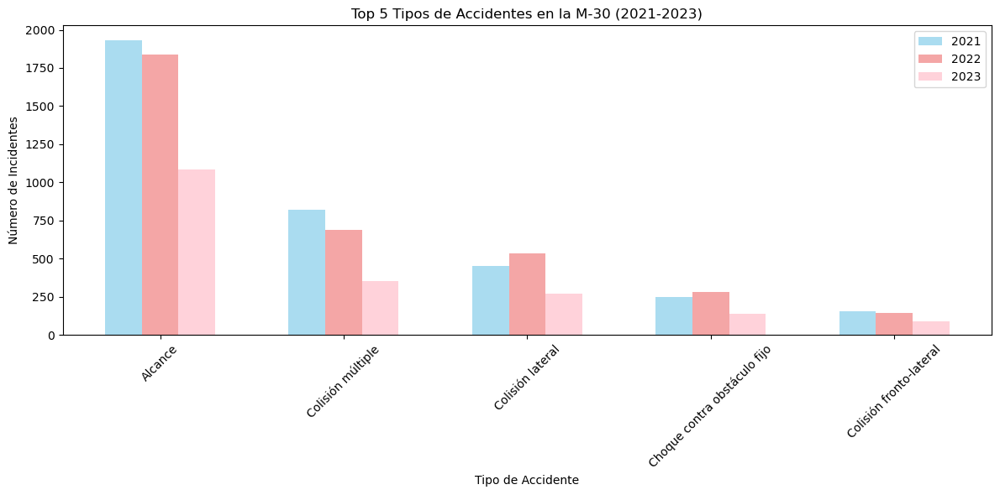

In [76]:
top_5_tipos_accidentes = comparativa.head(5)

# Crear el rango de posiciones en el eje x para las barras
x = np.arange(len(top_5_tipos_accidentes))

# Ancho de las barras
bar_width = 0.2

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))
plt.bar(x - bar_width, top_5_tipos_accidentes['2021'], width=bar_width, label='2021', color='skyblue', alpha=0.7)
plt.bar(x, top_5_tipos_accidentes['2022'], width=bar_width, label='2022', color='lightcoral', alpha=0.7)
plt.bar(x + bar_width, top_5_tipos_accidentes['2023'], width=bar_width, label='2023', color='pink', alpha=0.7)

# Personalizar el gráfico
plt.xlabel('Tipo de Accidente')
plt.ylabel('Número de Incidentes')
plt.title('Top 5 Tipos de Accidentes en la M-30 (2021-2023)')
plt.xticks(x, top_5_tipos_accidentes['tipo_accidente'], rotation=45)
plt.legend()

# Mostrar el gráfico
plt.tight_layout()
plt.show()

Por lo tanto se puede afirmar con seguridad que se ha incrementado la seguridad en la carretera prohibiendo la circulación a vehículos más antiguos

## Análisis de tramos con mayor Índice de accidentes de la autovía M-30
A continuación haremos un estudio sobre los tramos con mayor cantidad de accidentes en la autovía M-30 para acercarnos algo a lo que puede ser el causante de este problema

In [77]:
# Filtrando data solo para la autov. M-30
m30_data = df[df['localizacion'].str.contains('M-30', na=False)].copy()

m30_data_head = m30_data.head()

m30_data_head

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,...,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,numero_pasajeros,fugado,first_word
27,2022S000013,2022-01-01,8:10:00,"AUTOV. M-30, +01100I",+01100I,2.0,ARGANZUELA,Choque contra obstáculo fijo,Despejado,Turismo,...,H,NaN,NaN,"442679,507","4471637,799",1.0,0.0,1,No,AUTOV
35,2022S000018,2022-01-01,9:00:00,"AUTOV. M-30, +01100I PTO KM. 11,300 INTERIOR",+01100I,2.0,ARGANZUELA,Colisión fronto-lateral,Despejado,Turismo,...,H,14.0,Sin asistencia sanitaria,"442366,272","4471296,603",0.0,0.0,2,No,AUTOV
36,2022S000018,2022-01-01,9:00:00,"AUTOV. M-30, +01100I PTO KM. 11,300 INTERIOR",+01100I,2.0,ARGANZUELA,Colisión fronto-lateral,Despejado,Turismo,...,M,1.0,Atención en urgencias sin posterior ingreso,"442366,272","4471296,603",0.0,0.0,2,No,AUTOV
66,2022S000032,2022-01-02,1:00:00,CALL. VADO / AUTOV. M-30,1,12.0,USERA,Choque contra obstáculo fijo,Despejado,Furgoneta,...,H,NaN,NaN,"440991,275","4470831,56",1.0,0.0,1,No,CALL
81,2022S000049,2022-01-01,7:10:00,"AUTOV. M-30, +00900E, 09XC",+00900E,14.0,MORATALAZ,Alcance,Despejado,Turismo,...,M,NaN,NaN,"443429,899","4472683,605",0.0,0.0,6,No,AUTOV


In [78]:
import pandas as pd

accident_counts = m30_data.groupby('localizacion').size().reset_index(name='accident_count')

additional_columns = ['tipo_accidente', 'estado_meteorológico', 'coordenada_x_utm', 'coordenada_y_utm']

additional_info = m30_data.groupby('localizacion')[additional_columns].first().reset_index()

top_accident_info = pd.merge(accident_counts, additional_info, on='localizacion', how='left')

top_accident_locations = top_accident_info.sort_values(by='accident_count', ascending=False).head(10)
top_accident_locations

,localizacion,accident_count,tipo_accidente,estado_meteorológico,coordenada_x_utm,coordenada_y_utm
405,"AUTOV. M-30, +01100I",63,Choque contra obstáculo fijo,Despejado,"442679,507","4471637,799"
328,"AUTOV. M-30, +00800I",61,Alcance,Despejado,"443954,517","4474063,076"
372,"AUTOV. M-30, +01000E",54,Vuelco,Despejado,"443556,356","4472880,784"
381,"AUTOV. M-30, +01000I",41,Caída,Lluvia débil,"443097,502","4472044,115"
598,"AUTOV. M-30, +03200E",38,Colisión fronto-lateral,Despejado,"442769,131","4481836,124"
3,AUTOV. A-2 / AUTOV. M-30,34,Caída,Despejado,"444211,308","4477442,411"
192,"AUTOV. M-30, +00100E",29,Colisión múltiple,Despejado,"442904,278","4481407,411"
423,"AUTOV. M-30, +01200E",28,Alcance,Despejado,"441998,16","4470507,066"
295,"AUTOV. M-30, +00700I",28,Colisión lateral,Despejado,"444038,325","4474935,567"
1709,CALL. ALCALA / AUTOV. M-30,26,Colisión lateral,Despejado,"443995,675","4475868,352"


Los tramos de la M-30 con el mayor número de accidentes son:

1. AUTOV. M-30, +01100I con 63 accidentes.
2. AUTOV. M-30, +00800I con 61 accidentes.
3. AUTOV. M-30, +01000E con 54 accidentes.
4. AUTOV. M-30, +01000I con 41 accidentes.
5. AUTOV. M-30, +03200E con 38 accidentes.
6. AUTOV. A-2 / AUTOV. M-30 con 34 accidentes.
7. AUTOV. M-30, +00100E con 29 accidentes.
8. AUTOV. M-30, +01200E con 28 accidentes.
9. AUTOV. M-30, +00700I con 28 accidentes.
10. CALL. ALCALA / AUTOV. M-30 con 26 accidentes.

#### Aplicando modas para 'tipo_accidente' y 'estado_meteorologico'
Para obtener mayor información aplicamos las modas de los tipos de accidentes y los estados meteorológicos en cada localidad. De esta manera nos dara el valor que más se repitió

In [93]:
import pandas as pd

# Define los tramos con más accidentes
top_locations = [
    'AUTOV. M-30, +01100I',
    'AUTOV. M-30, +00800I',
    'AUTOV. M-30, +01000E',
    'AUTOV. M-30, +01000I',
    'AUTOV. M-30, +03200E',
    'AUTOV. A-2 / AUTOV. M-30',
    'AUTOV. M-30, +00100E',
    'AUTOV. M-30, +01200E',
    'AUTOV. M-30, +00700I',
    'CALL. ALCALA / AUTOV. M-30'
]

top_m30_data = m30_data[m30_data['localizacion'].isin(top_locations)]

# Agrupa por 'localizacion' y encuentra la moda para 'tipo_accidente' y 'estado_meteorológico'
modes = top_m30_data.groupby('localizacion').agg(
    {'tipo_accidente': pd.Series.mode, 'estado_meteorológico': pd.Series.mode}).reset_index()

# Une la información de moda con el DataFrame 'top_accident_locations'
top_accident_locations_with_modes = pd.merge(
    top_accident_locations,
    modes,
    on='localizacion',
    how='left',
    suffixes=('', '_mode')
)

# El DataFrame 'top_accident_locations_with_modes' ahora tiene una sola columna para cada atributo
top_accident_locations_with_modes = top_accident_locations_with_modes.drop(
    columns=['tipo_accidente_mode', 'estado_meteorológico_mode'])

top_accident_locations_with_modes

,localizacion,accident_count,tipo_accidente,estado_meteorológico,coordenada_x_utm,coordenada_y_utm
0,"AUTOV. M-30, +01100I",63,Choque contra obstáculo fijo,Despejado,"442679,507","4471637,799"
1,"AUTOV. M-30, +00800I",61,Alcance,Despejado,"443954,517","4474063,076"
2,"AUTOV. M-30, +01000E",54,Vuelco,Despejado,"443556,356","4472880,784"
3,"AUTOV. M-30, +01000I",41,Caída,Lluvia débil,"443097,502","4472044,115"
4,"AUTOV. M-30, +03200E",38,Colisión fronto-lateral,Despejado,"442769,131","4481836,124"
5,AUTOV. A-2 / AUTOV. M-30,34,Caída,Despejado,"444211,308","4477442,411"
6,"AUTOV. M-30, +00100E",29,Colisión múltiple,Despejado,"442904,278","4481407,411"
7,"AUTOV. M-30, +01200E",28,Alcance,Despejado,"441998,16","4470507,066"
8,"AUTOV. M-30, +00700I",28,Colisión lateral,Despejado,"444038,325","4474935,567"
9,CALL. ALCALA / AUTOV. M-30,26,Colisión lateral,Despejado,"443995,675","4475868,352"


In [91]:
modes

,localizacion,tipo_accidente,estado_meteorológico
0,AUTOV. A-2 / AUTOV. M-30,Alcance,Despejado
1,"AUTOV. M-30, +00100E",Alcance,Despejado
2,"AUTOV. M-30, +00700I",Colisión múltiple,Despejado
3,"AUTOV. M-30, +00800I",Alcance,Despejado
4,"AUTOV. M-30, +01000E",Alcance,Despejado
5,"AUTOV. M-30, +01000I",Alcance,Despejado
6,"AUTOV. M-30, +01100I",Alcance,Despejado
7,"AUTOV. M-30, +01200E",Colisión múltiple,Despejado
8,"AUTOV. M-30, +03200E",Alcance,Despejado
9,CALL. ALCALA / AUTOV. M-30,"[Colisión fronto-lateral, Colisión lateral]",Despejado


In [116]:
top_accident_locations_with_modes['coordenada_x_utm'] = pd.to_numeric(
    top_accident_locations_with_modes['coordenada_x_utm'].str.replace(',', '.'), errors='coerce')
top_accident_locations_with_modes['coordenada_y_utm'] = pd.to_numeric(
    top_accident_locations_with_modes['coordenada_y_utm'].str.replace(',', '.'), errors='coerce')

In [117]:
from my_map_creator import MapCreator

mapa_M30 = MapCreator(top_accident_locations_with_modes, lat_col_name="coordenada_x_utm",
                      long_col_name="coordenada_y_utm")

In [70]:
mapa_M30.set_columns_for_label(['localizacion', 'accident_count', 'tipo_accidente', 'estado_meteorológico'])
mapa_M30.create_map(map_name="mapa_M30")

Vamos a desglosar los accidentes en cada sección con más accidentes para saber qué es lo que suele pasar

In [142]:
import my_map_creator
from PIL import Image
from IPython.display import display


def visualizador_accidentes(df0: pd.DataFrame, location: str):
    df0 = df0[df0['localizacion'] == location]
    df0['coordenada_x_utm'] = pd.to_numeric(
        df0['coordenada_x_utm'].str.replace(',', '.'), errors='coerce')
    df0['coordenada_y_utm'] = pd.to_numeric(
        df0['coordenada_y_utm'].str.replace(',', '.'), errors='coerce')

    print(df0.groupby('tipo_accidente').count().reset_index().filter(items=['tipo_accidente', 'num_expediente']))
    lat, long = my_map_creator.utm_to_latlon(df0['coordenada_x_utm'].head(1), df0['coordenada_y_utm'].head(1))
    print(str(lat), str(long))


def display_img(file_path):
    imagen = Image.open(file_path)
    display(imagen)

### 'AUTOV. M-30, +01100I'

In [143]:
visualizador_accidentes(top_m30_data.copy(), 'AUTOV. M-30, +01100I')

                 tipo_accidente  num_expediente
0                       Alcance              48
1  Choque contra obstáculo fijo               4
2             Colisión múltiple              11
27    40.393369
dtype: float64 27   -3.675406
dtype: float64


In [90]:
df

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,...,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,numero_pasajeros,fugado,first_word
27,2022S000013,2022-01-01,8:10:00,"AUTOV. M-30, +01100I",+01100I,2.0,ARGANZUELA,Choque contra obstáculo fijo,Despejado,Turismo,...,H,NaN,NaN,"442679,507","4471637,799",1.0,0.0,1,No,AUTOV
921,2022S000526,2022-01-11,16:15:00,"AUTOV. M-30, +01100I",+01100I,2.0,ARGANZUELA,Colisión múltiple,Despejado,Motocicleta > 125cc,...,H,2.0,Ingreso inferior o igual a 24 horas,"442533,217","4471513,69",0.0,0.0,5,No,AUTOV
922,2022S000526,2022-01-11,16:15:00,"AUTOV. M-30, +01100I",+01100I,2.0,ARGANZUELA,Colisión múltiple,Despejado,Motocicleta > 125cc,...,M,1.0,Atención en urgencias sin posterior ingreso,"442533,217","4471513,69",0.0,0.0,5,No,AUTOV
923,2022S000526,2022-01-11,16:15:00,"AUTOV. M-30, +01100I",+01100I,2.0,ARGANZUELA,Colisión múltiple,Despejado,Turismo,...,H,14.0,Sin asistencia sanitaria,"442533,217","4471513,69",0.0,0.0,5,No,AUTOV
924,2022S000526,2022-01-11,16:15:00,"AUTOV. M-30, +01100I",+01100I,2.0,ARGANZUELA,Colisión múltiple,Despejado,Turismo,...,M,14.0,Sin asistencia sanitaria,"442533,217","4471513,69",0.0,0.0,5,No,AUTOV
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40635,2022S036672,2022-11-30,7:35:00,"AUTOV. M-30, +01100I",+01100I,2.0,ARGANZUELA,Colisión múltiple,Despejado,Turismo,...,M,14.0,Sin asistencia sanitaria,"442289,736","4471176,254",0.0,0.0,3,No,AUTOV
41677,2022S038162,2022-12-07,18:05:00,"AUTOV. M-30, +01100I",+01100I,2.0,ARGANZUELA,Alcance,Nublado,Turismo,...,H,14.0,Sin asistencia sanitaria,"442480,352","4471438,047",0.0,0.0,4,No,AUTOV
41678,2022S038162,2022-12-07,18:05:00,"AUTOV. M-30, +01100I",+01100I,2.0,ARGANZUELA,Alcance,Nublado,Turismo,...,H,14.0,Sin asistencia sanitaria,"442480,352","4471438,047",0.0,0.0,4,No,AUTOV
41679,2022S038162,2022-12-07,18:05:00,"AUTOV. M-30, +01100I",+01100I,2.0,ARGANZUELA,Alcance,Nublado,Turismo,...,H,14.0,Sin asistencia sanitaria,"442480,352","4471438,047",0.0,0.0,4,No,AUTOV


ValueError: Could not save to JPEG for display

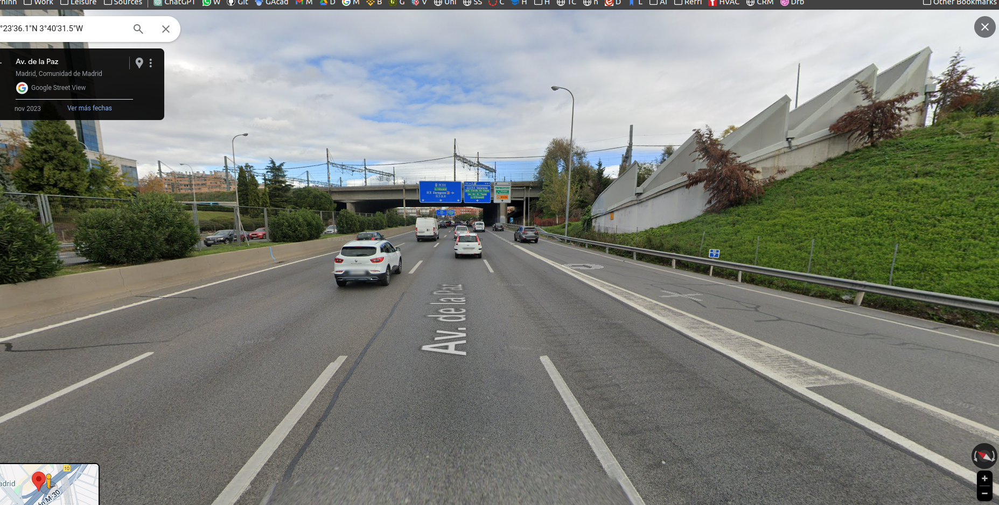

In [140]:
display_img("img/'AUTOV. M-30, +01100I'SALIDA_PT_VALLECAS.png")

ValueError: Could not save to JPEG for display

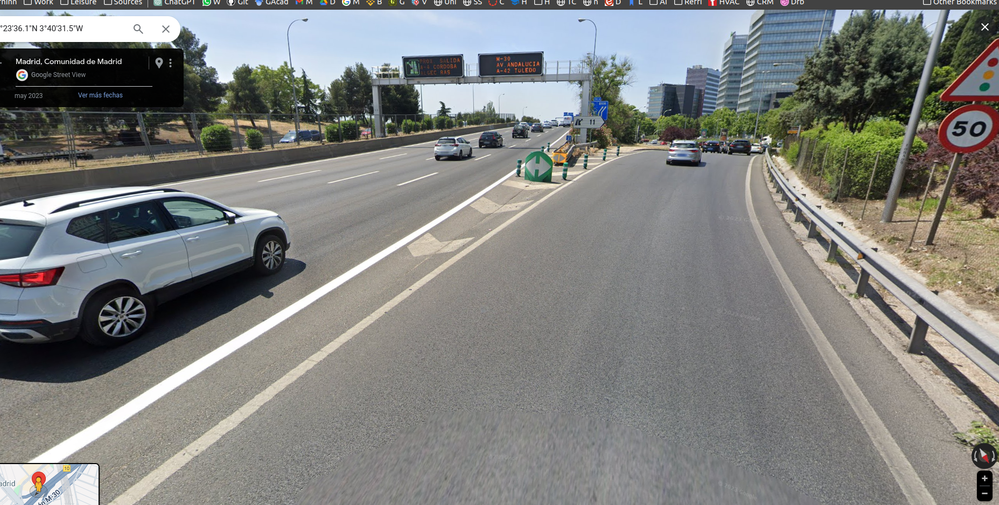

In [141]:
display_img("img/'AUTOV. M-30, +01100I'SALIDA_MNDZ_ALVARO.png")

El número de alcances parece que se debe a una rampa con rasante y semáforo en una dirección. La salida suele estar congestionada en las horas en las que se han dado la mayoría de los accidentes, que es sobre las 8 de la mañana y las, de 14 a 16, y de 18 a 20.
Son horas que coinciden con la entrada y salida.

Recomendamos colocar otra señal para alertar del semáforo un poco antes de la señal actual.

En el otro sentido, tenemos un trenzado. Pues existe justo una entrada de coches a la vez que una salida. Los coches al intentar incorporarse y salir realizan maniobras simultáneas, aumentado el riesgo de alcance si no se presta atención. 
Se recomienda colocar la nueva señal de peligro trenzado.
No se recomienda colocar radar en ninguna de las dos direcciones, ya que los accidentes ocurren en las horas más congestionadas

### AUTOV. M-30, +00800I


In [144]:
visualizador_accidentes(top_m30_data.copy(), 'AUTOV. M-30, +00800I')

                 tipo_accidente  num_expediente
0                       Alcance              43
1                         Caída               1
2  Choque contra obstáculo fijo               1
3              Colisión frontal               4
4             Colisión múltiple              12
4779    40.415304
dtype: float64 4779   -3.660597
dtype: float64


ValueError: Could not save to JPEG for display

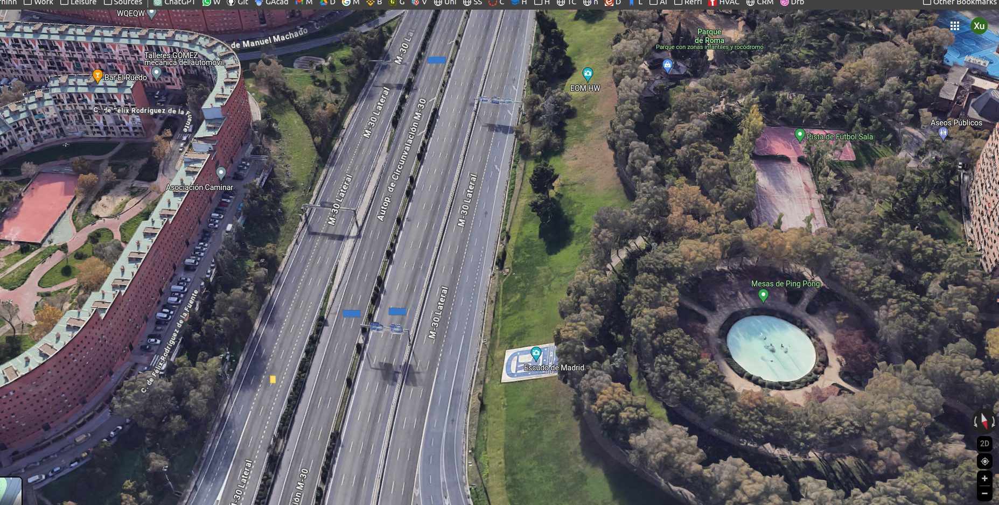

In [145]:
display_img("img/'AUTOV. M-30, +00800I'OVERVIEW.png")

En esta situación no existe un trenzado pero sí una doble incorporación con reducción de carril derecho.

ValueError: Could not save to JPEG for display

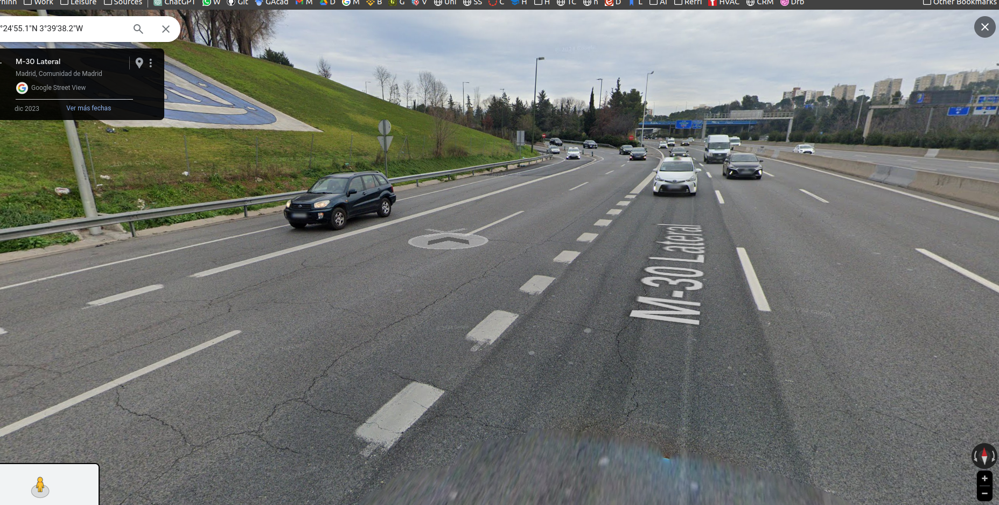

In [146]:
display_img("img/'AUTOV. M-30, +00800I'DOBLE_INCORPORACION.png")

Tras revisar los alrededores, puedo concluir que está debidamente señalizada. La zona marca una velocidad límite de 90